In [1]:
! python -m pip install requests
! python -m pip install beautifulsoup4
! python -m pip install pillow

In [2]:
import requests
from bs4 import BeautifulSoup

## Get book links 

In [3]:
def extract_pages_urls(URL):
  # Get the 5 URL's (pages) that are in the main page 
  page = requests.get(URL)
  soup = BeautifulSoup(page.content, "html.parser")
  pagination = soup.find('div', class_="pagination1")
  pages_urls = set()
  for page in pagination.find_all("a"):
    pages_urls.add(page.attrs['href'])
  return(pages_urls)

def extract_book_links(URL):
  # Get links of all the books in the page (URL)
  page = requests.get(URL)
  soup = BeautifulSoup(page.content, "html.parser")
  results = soup.find_all(id="prod")
  book_links = set()
  for res in results:
    book = res.find("a", rel="noopener noreferrer")
    book_links.add(book.attrs['href'])
  return book_links

In [4]:
initial_URL = "https://monkeypen.com/pages/free-childrens-books/"

all_book_links = set()
for URL in extract_pages_urls(initial_URL):
  all_book_links = all_book_links.union(extract_book_links(URL))

In [5]:
print(f'We have obtained {len(all_book_links)} links from different books')

We have obtained 50 links f different books


## Get book text and images

In [6]:
def clean_txt(txt, remove_list=['\xa0', '<strong>', '</strong>', '<br/>']):
  for element in remove_list:
    txt = txt.replace(element, '')
  clean_txt = txt.strip()
  return clean_txt

def get_text(res_line):
  try:
    text = '\n'.join([str(cont.text) for cont in res_line.contents if str(cont.text) != '<br/>'])
  except:
    text = '\n'.join([str(cont) for cont in res_line.contents if str(cont) != '<br/>'])
  finally:
    text = clean_txt(text)
  return text

def get_book(URL):
  page = requests.get(URL)
  book_soup = BeautifulSoup(page.content, "html.parser")
  is_book_active = False
  last_turn = 'image'
  book_txt = []
  book_img = []
  results = book_soup.find_all(['div', 'p'], style=['text-align: left;', 'text-align: start;',''])
  for res in results:
    # Check if the html is book story
    if (
      (res.name == 'p') and
      (len(res.contents) > 0)
    ):
      if (
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 1) and
          (any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents[0].contents))
        ) or
          any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents)
      ):
        is_book_active = True
        continue
      elif (
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 1) and
          (any(str(cont).find('Please share our books') != -1 for cont in res.contents[0].contents))
        ) or
          any(str(cont).find('Please share our books') != -1 for cont in res.contents)
      ):
        is_book_active = False
        break
  
    if is_book_active: # Book pages html
      # Check images
      if (
        (len(res.contents) > 0) and 
        (
          ('attrs' in vars(res.contents[0]).keys()) and
          ('src' in res.contents[0].attrs.keys())
        ) or
        (
          (len(res.contents) > 1) and
          ('attrs' in vars(res.contents[1]).keys()) and
          ('src' in res.contents[1].attrs.keys())
        )
      ): # Extract image link
        try:
          image_link = res.contents[0]['src']
        except:
          image_link = res.contents[1]['src']
        book_img.append(image_link)
        last_turn = 'image'
      elif (
        (len(res.contents) > 0) and 
        (
          ('contents' in vars(res.contents[0]).keys()) and
          (len(res.contents[0].contents) > 0) and
          ('attrs' in vars(res.contents[0].contents[0]).keys()) and
          ('src' in res.contents[0].contents[0].attrs.keys())  
        )
      ): # Extract image link
        image_link = res.contents[0].contents[0]['src']
        book_img.append(image_link)
        last_turn = 'image'

      # Extract text
      else: 
        text = get_text(res)
        if len(text) > 0:
          if last_turn == 'text': # Add to previous text chunk
            book_txt[-1] += '\n' + text
          else: # Add as new text chunk
            book_txt.append(text)
            last_turn = 'text'

  return {'book_txt': book_txt[:], 'book_img': book_img[1:]} # The first image is book cover

In [7]:
books = []
for URL in all_book_links:
  book = get_book(URL)
  book_txt, book_img = book['book_txt'], book['book_img']  

  if abs(len(book_txt) - len(book_img)) > 2:
    continue # Too much differece

  elif len(book_txt) - len(book_img) >= 1:
    while len(book_txt) - len(book_img) != 0:
      book_txt.pop() # Correct extra txt
  
  elif len(book_img) - len(book_txt) >= 1:
    while len(book_img) - len(book_txt) != 0:
      book_img.pop() # Correct extra img

  book = {'book_txt': book_txt, 'book_img': book_img, 'book_url': URL}
  books.append(book)
 
print(len(books), 'books!')

49 books!


## Data exploration

In [8]:
total_samples = 0
for book in books:
  total_samples += len(book['book_txt'])
print(f'Num samples: {total_samples}')

Num samples: 777



Example 0: book 41 (https://monkeypen.com/blogs/news/the-naughty-monkey-free-children-book), paragraph 14
Baba slips on the banana peel. His feet go way up into the air. Plop! He lands on his back again. This time Sophie and Ashley sit on top of Baba. He can’t move now!


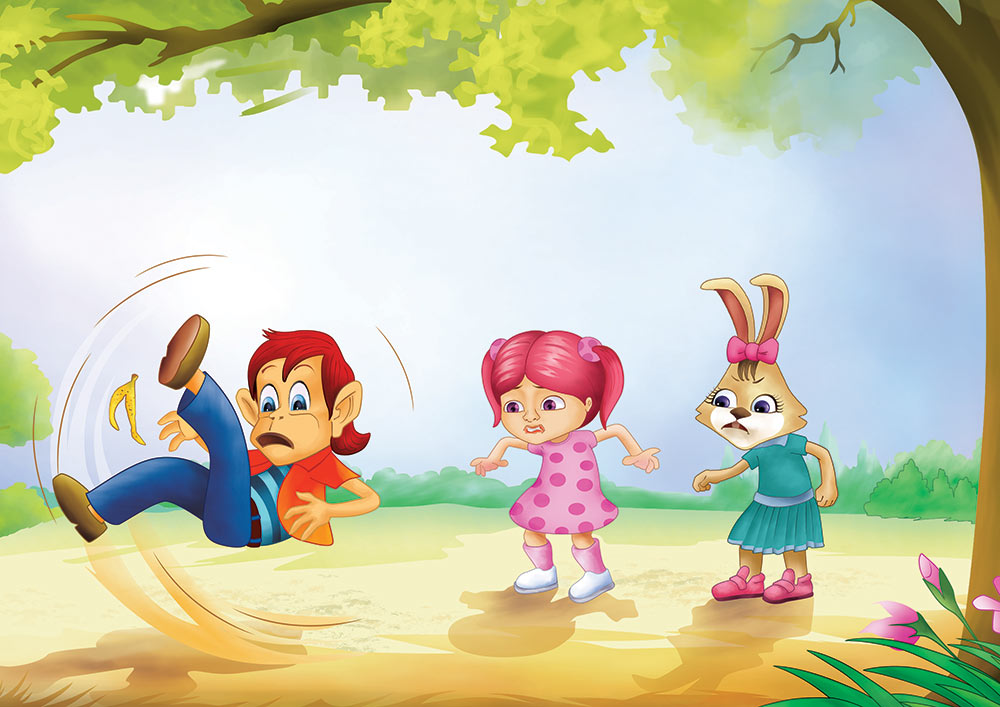


Example 1: book 27 (https://monkeypen.com/blogs/news/the-homeless-monkey-free-children-book), paragraph 2
He wanted to see the world’s smallest and biggest wonders. He traveled from village to village, town to town,


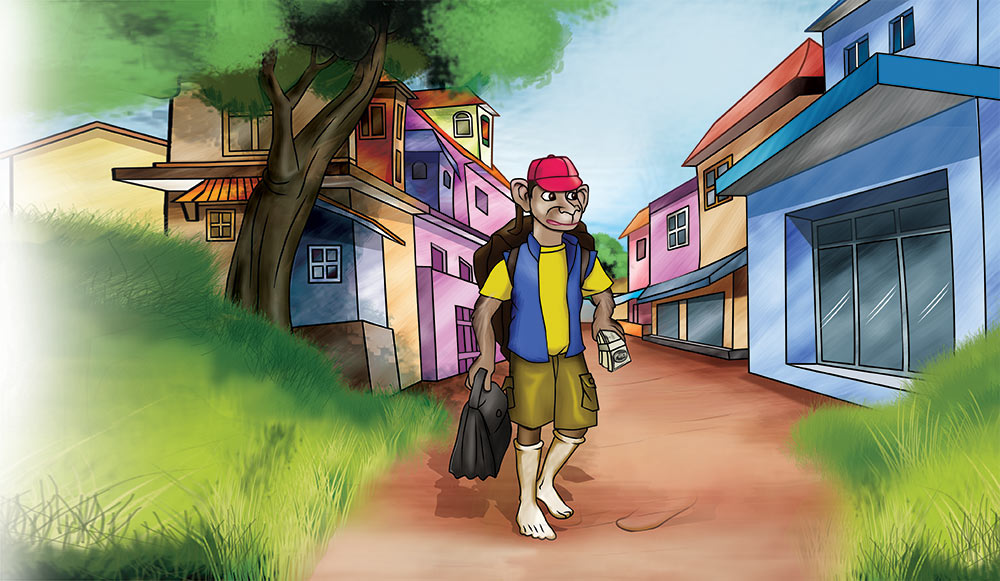


Example 2: book 1 (https://monkeypen.com/blogs/news/samatha-the-girl-scientist-free-children-book), paragraph 2
• 2 small pieces of white cardboard or index cards. • Tape • A pencil to be used as a shaft • Crayons, colored pencils or whatever you want to draw with


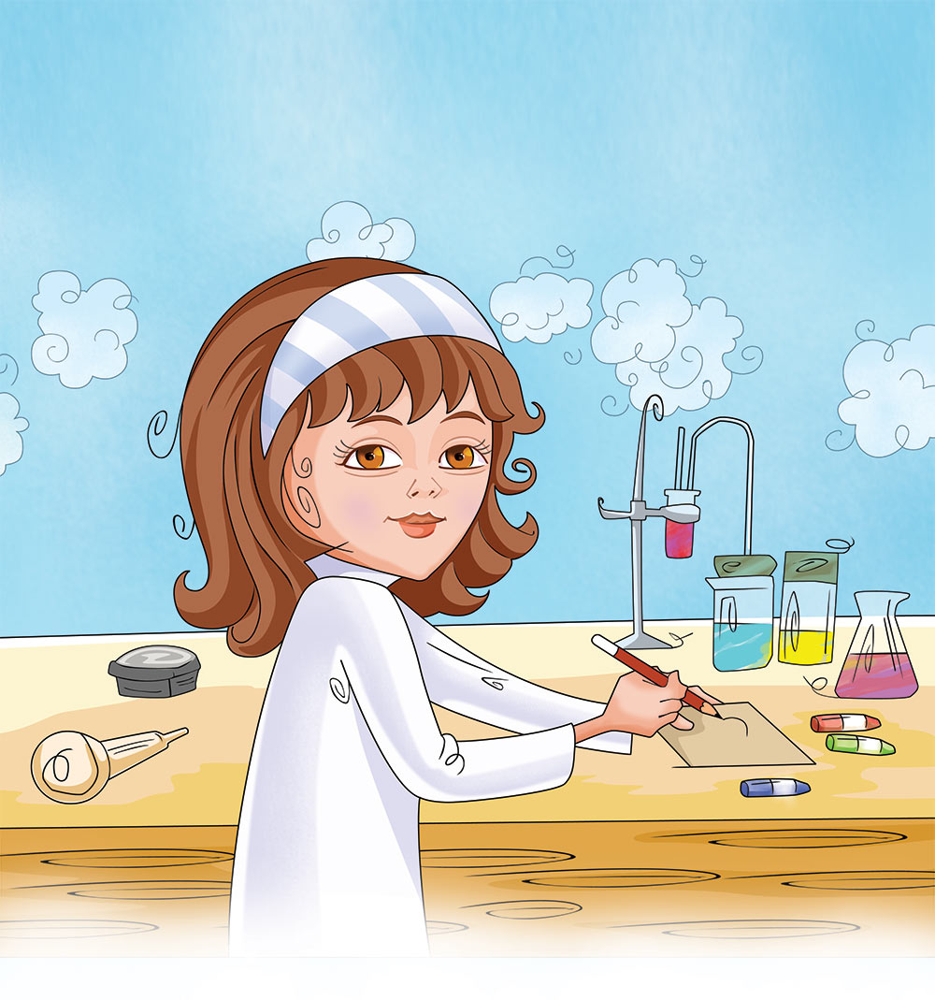


Example 3: book 34 (https://monkeypen.com/blogs/news/hey-mom-what-is-diversity-free-children-book), paragraph 2
"Hey mom! What is DIVERSITY?"


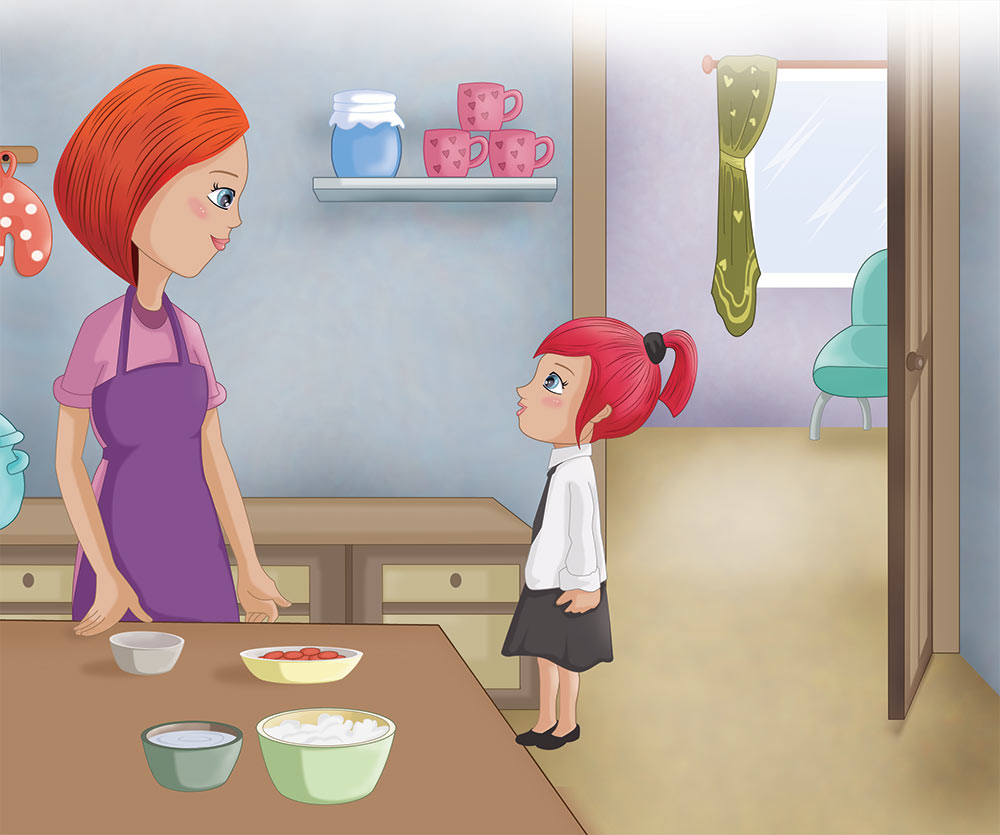


Example 4: book 13 (https://monkeypen.com/blogs/news/kroaker-the-bullfrog-free-children-book), paragraph 17
“We have to learn a lesson from this,” said Kroaker to his family. “At the first sign of danger, use common sense and act quickly to save yourself.”


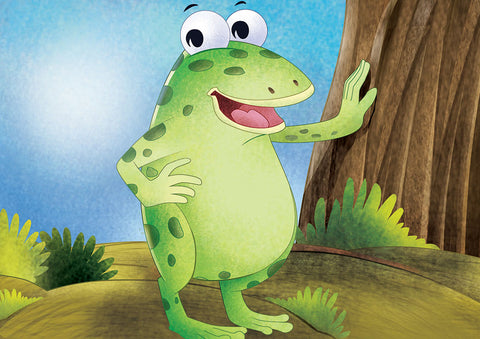


Example 5: book 20 (https://monkeypen.com/blogs/news/terrance-turtles-new-home-free-children-book), paragraph 6
“It will work.” said Sally. “I agree.” said Terrance. “Maybe.” said Sam.Sam looked at Terrance and Sally for a few minutes and said, “Yes, I think it will work but none of us can talk or open our mouths, no matter what! Does everyone understand? does very one agree?” “Yes.” said Sally. “I agree too.” said Terrance. “Terrance,” Sam firmly said. “It is most important that you DO NOT talk or open your mouth. Remember, you can’t fly!”“I understand.” said Terrance.


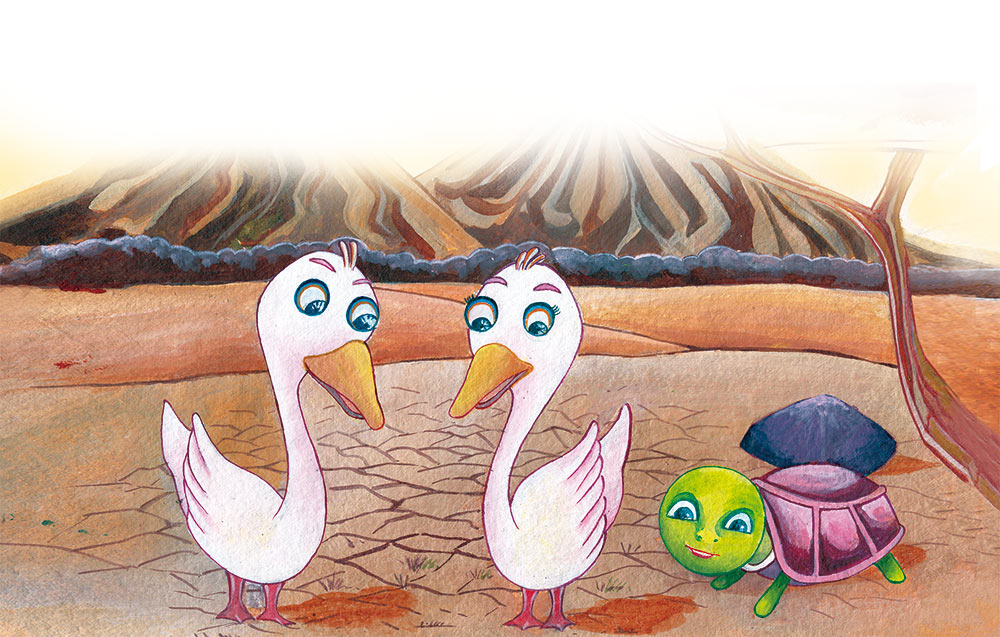


Example 6: book 45 (https://monkeypen.com/blogs/news/the-way-of-the-woods-free-children-book), paragraph 4
One day, Slither, the snake visited King Paw-Paw and told him of a strange animal he saw close by. Paw-Paw asked, “Where did you see this animal?”Slither replied.“It lives with the strange, two- legged creature 

at the edge of our woods.”


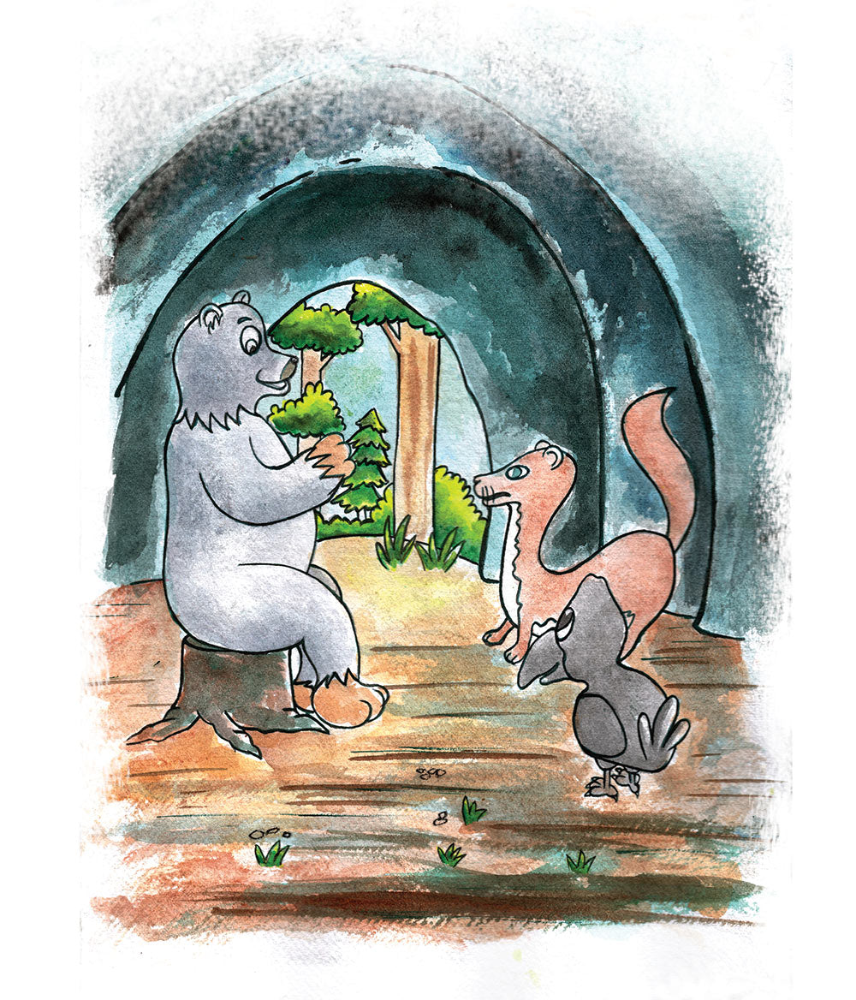


Example 7: book 11 (https://monkeypen.com/blogs/news/do-you-wonder-how-snakes-slither-free-children-book), paragraph 7
Most of you think slithering is the only way we move. It is our most common way and you could think of it as your walking. We push off something like a bump on the ground or a rock to get going. Then we move in a wavy motion using our tummy scales and muscles to pull us along. It is called the Serpentine method but slithering is just fine.


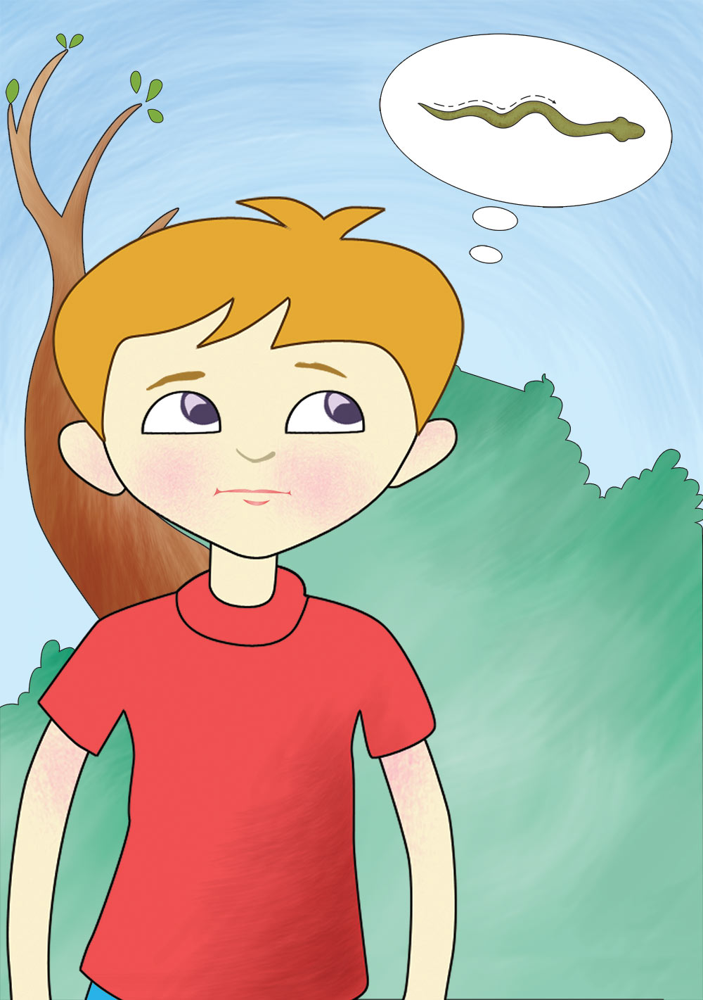


Example 8: book 1 (https://monkeypen.com/blogs/news/samatha-the-girl-scientist-free-children-book), paragraph 8
It’s simple to set-up. Just draw a square about ¼ inch to one side of a white piece of paper and color it in. Draw a circle about 3 to 4 inches to the right that’s about the same size as the square and color it in. This is the dot you are going to make disappear. Actually you can draw two small pictures, or letters, or numbers, or whatever you want. One of them will disappear.


• After you draw them hold the paper at arm’s length.

• Close your left eye and focus on the square with your right eye.

• Slowly move the paper towards you.

• At some point the dot will disappear.

• Try it again and make the square disappear. 

 Close your right eye and focus on the dot with 

 your left eye. Move the paper towards 

 you until the square disappears.


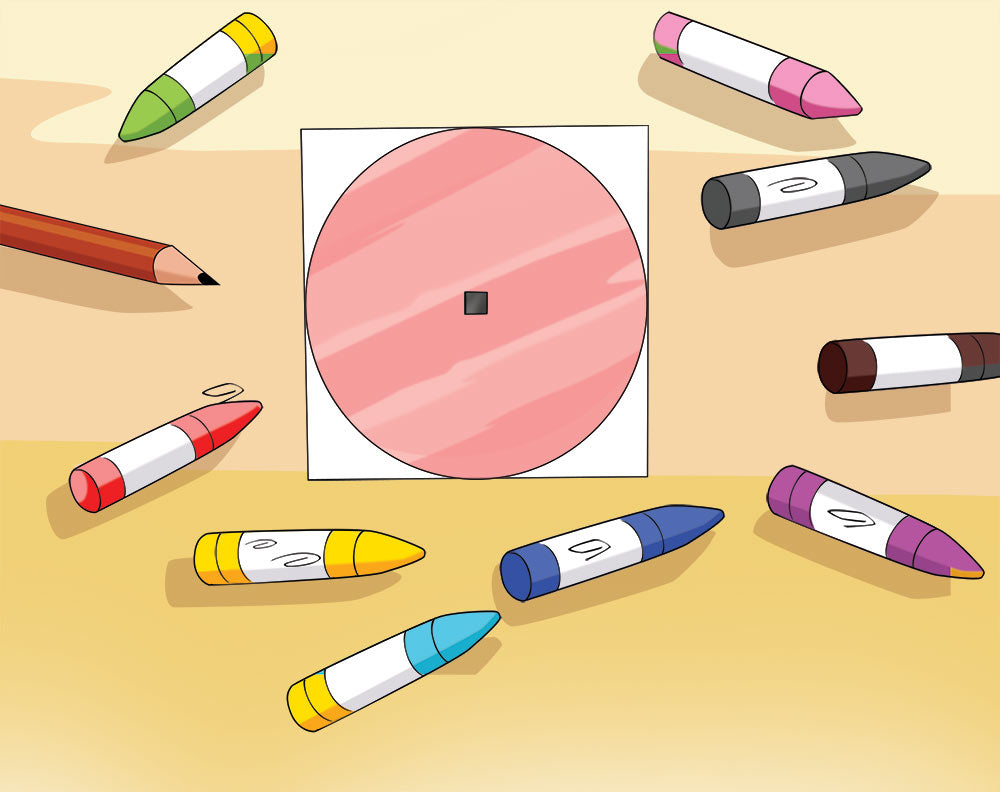


Example 9: book 2 (https://monkeypen.com/blogs/news/do-you-wonder-how-the-ladybug-got-its-name-free-children-book), paragraph 4
Sally Sue’s mommy said that it looked like there were little bugs called aphids eating her vegetable plants. Sally Sue was sad. But her mommy told her not to worry. In a few days there would be some hero bugs coming to the rescue.


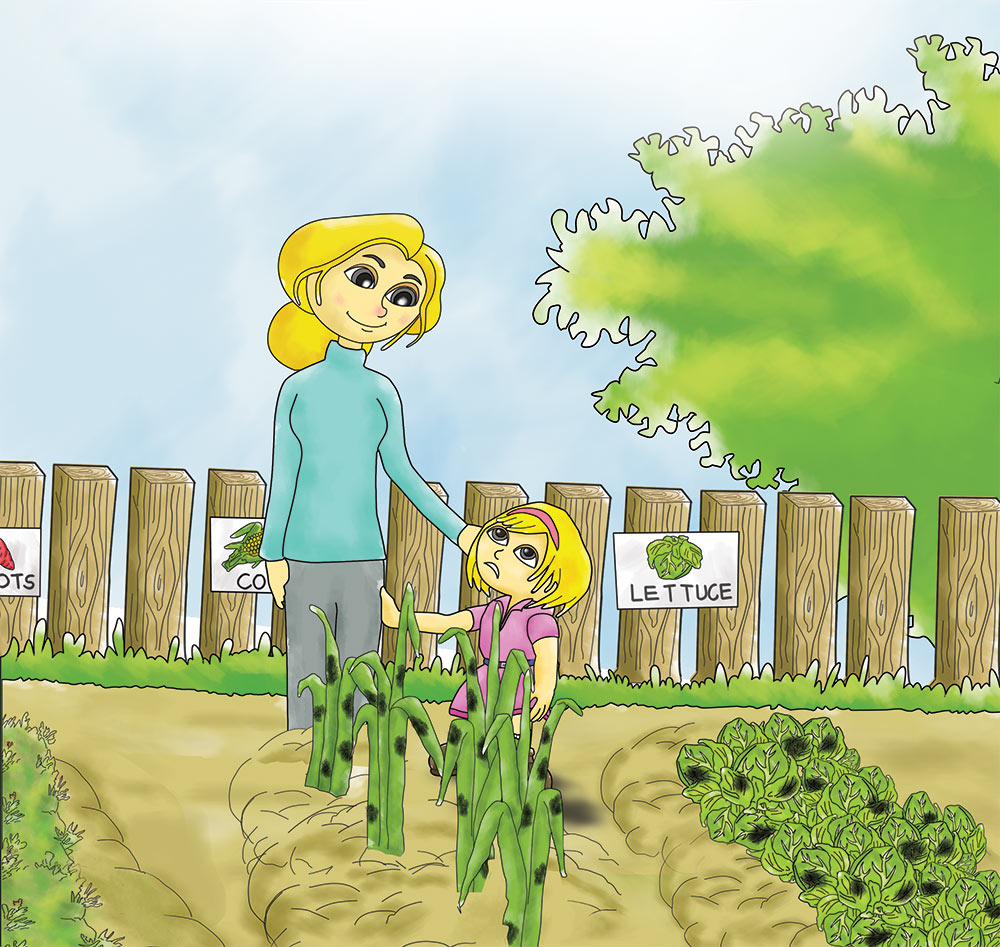


Example 10: book 11 (https://monkeypen.com/blogs/news/do-you-wonder-how-snakes-slither-free-children-book), paragraph 12
Wow! After talking to you about the way we move, I guess it is easier just to say we SLITHER.


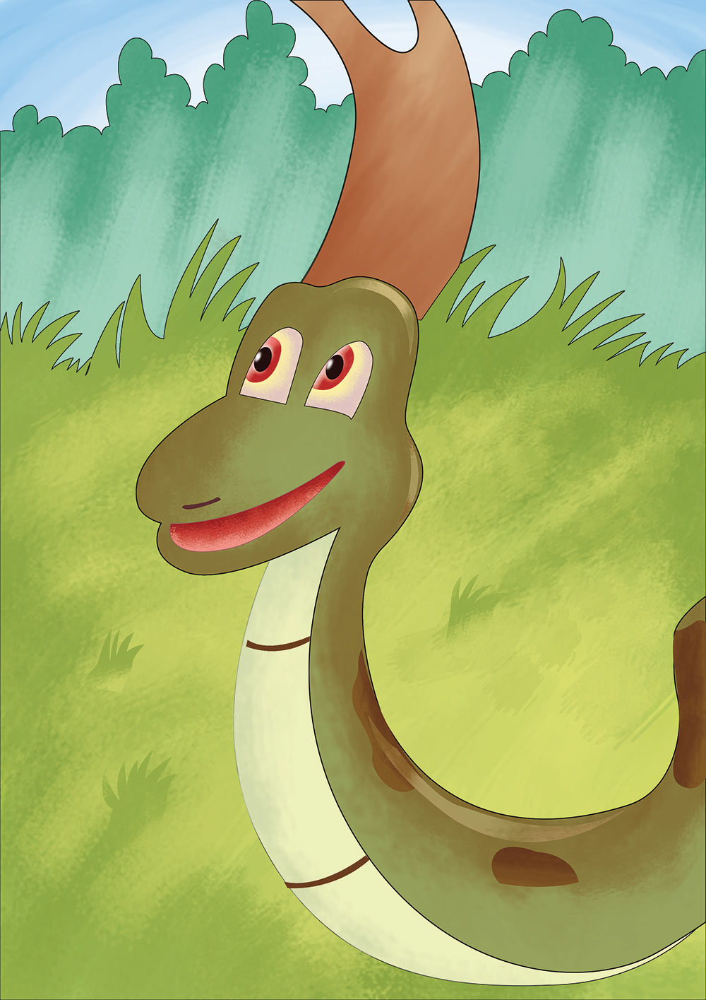


Example 11: book 25 (https://monkeypen.com/blogs/news/the-lunker-free-children-book), paragraph 17
We were amazed to see.


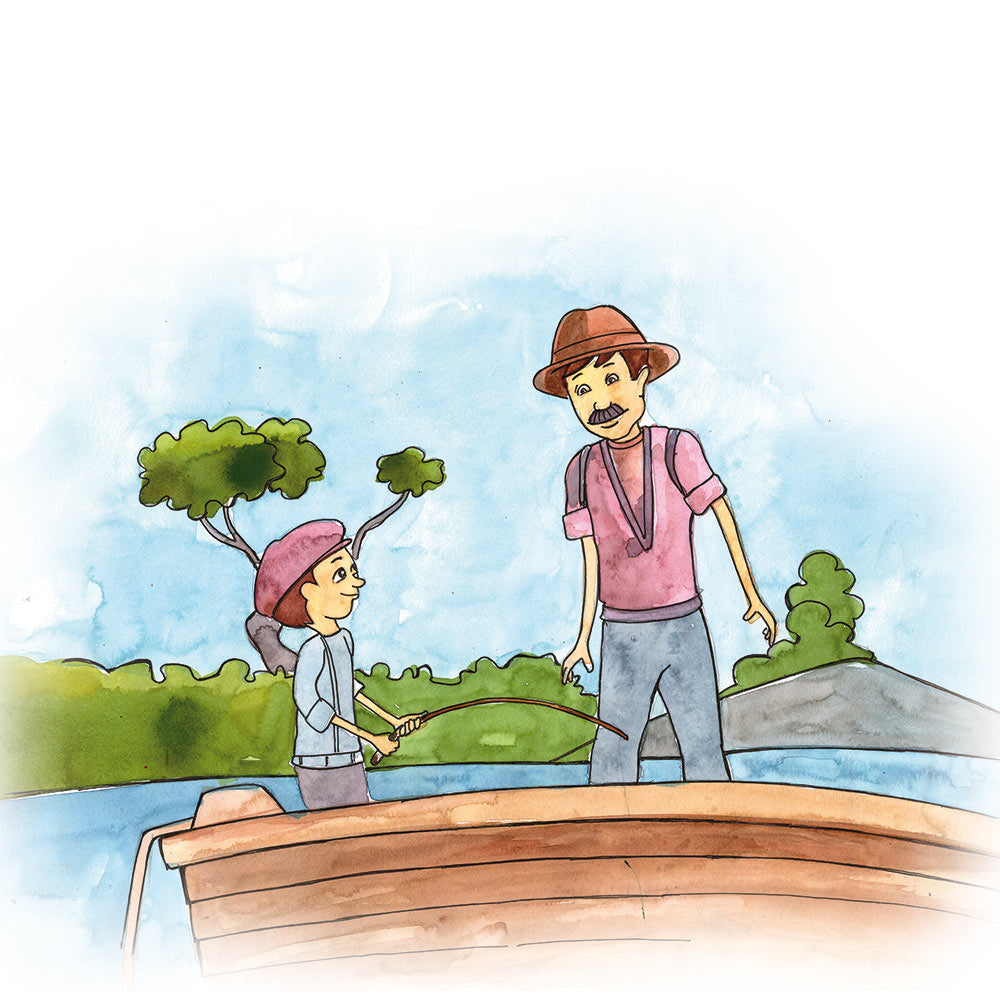


Example 12: book 31 (https://monkeypen.com/blogs/news/hammy-the-hamster-free-children-book), paragraph 3
We might get trapped and become someone’s pet.

So we are mostly out after dark.


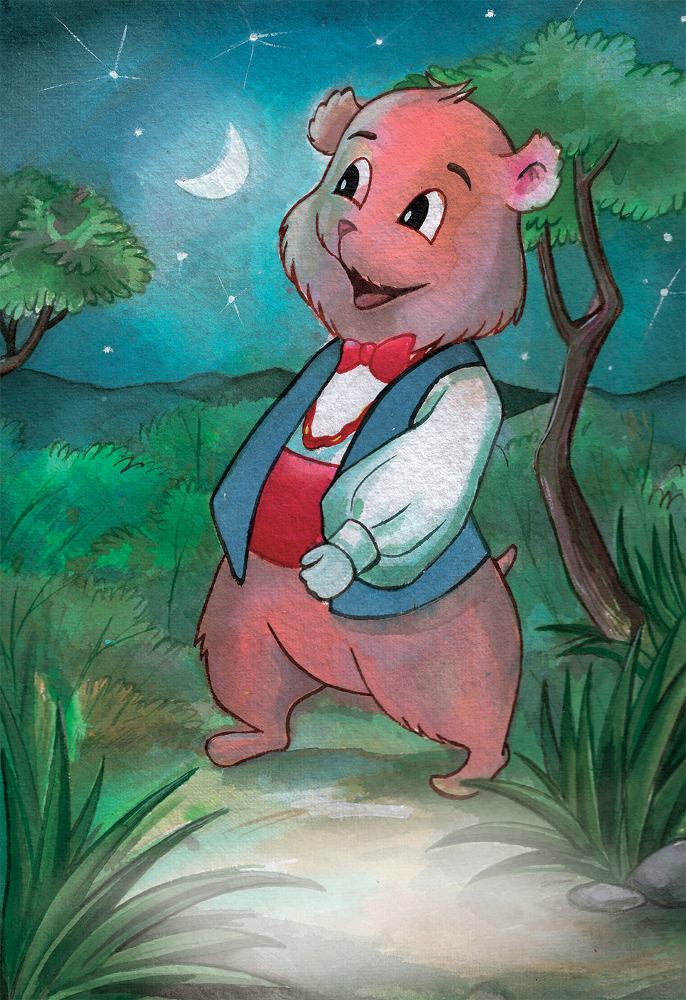


Example 13: book 30 (https://monkeypen.com/blogs/news/mix-it-up-free-children-book), paragraph 17
“I think I’ll make the Southern Belle hot cocoa, topped with vanilla ice cream, and use a candy cane stirrer.”She said to herself. Just as she finished cooking, the door opened and a red-cheeked Sally came in and took off her gloves, coat, hat, scarf, and boots. “What’s that wonderful smell?” Sally said with a smile. “I hope it’s what I think it is.” All three sat and sipped the hot cocoa while Sally told them about her adventures outside.Sally giggled and said,“And I thought I was bored.”


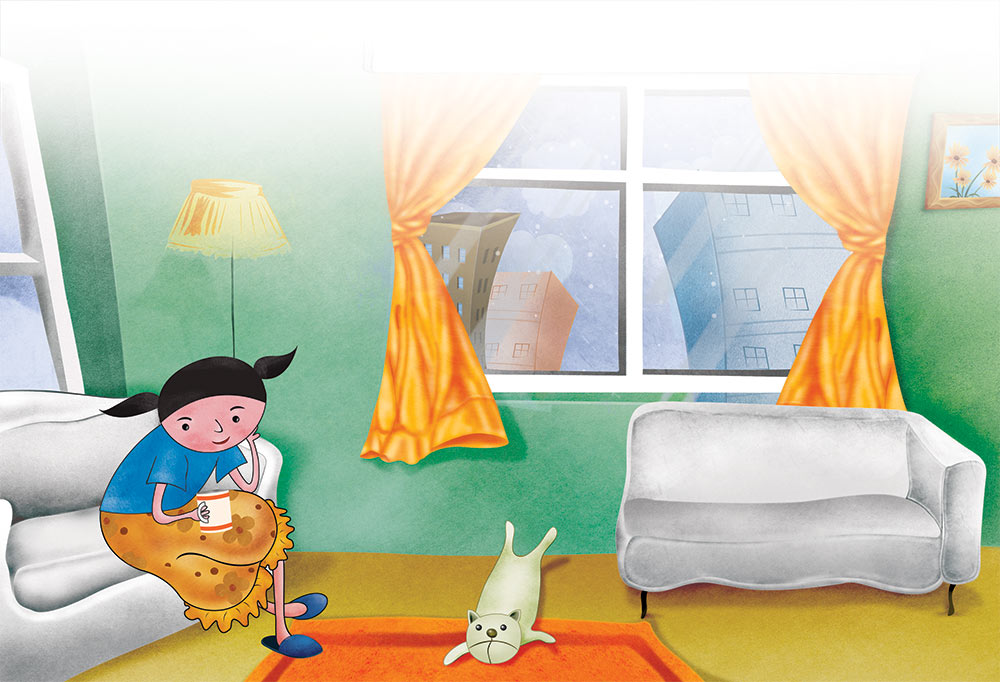


Example 14: book 14 (https://monkeypen.com/blogs/news/dragons-free-children-book), paragraph 10
The Druk is the “Thunder Dragon” of Bhutanese stories. This dragon is the national symbol of Bhutan. The Thunder Dragon is a giant snake-like, wingless animal with four legs and scales on its body. The flag of Bhutan has a Druk and the Bhutanese people call their country Druk Yul (Land of Druk).


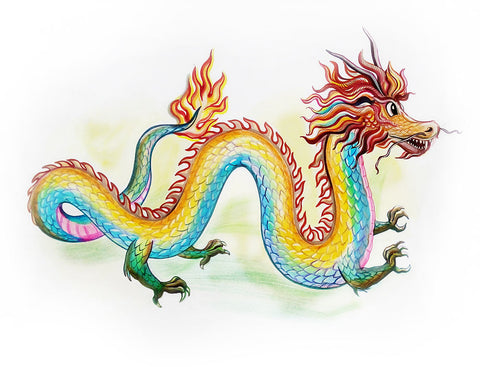

In [32]:
import random
import urllib.request
from PIL import Image

n_examples = 15

for i in range(n_examples):
  book_idx = random.randint(0, len(books)-1)
  book = books[book_idx]
  book_url = book['book_url']
  pairs = list(zip(book['book_img'], book['book_txt']))
  pair_idx = random.randint(0, len(pairs)-1)
  pair = pairs[pair_idx]

  print(f'\nExample {i}: book {book_idx} ({book_url}), paragraph {pair_idx}')
  print(pair[1])
  urllib.request.urlretrieve(pair[0], f"images/{i}.png")
  Img = Image.open(f"images/{i}.png")
  display(Img)


## Debugging

In [10]:
books[10]

{'book_txt': ['“Hi! My name is Samuel and I want to be a scientist. You may be wondering why and my answer is simple. I am amazed at all the wonderful things like rockets to the Moon, fire trucks pumping out all that water, fast race cars, space ships, and the list goes on. But those are big things and I just don’t understand everything about them yet.\n\nI also wonder about small things like-how does sugar turn into crystals called rock candy? Or how are those rock formations in caves made? Hmm – I know it has something to do with Science.\n\nMy sister Samantha wants to be a scientist too, but she likes things that I don’t-like why her dolls eyes open and close. But even though we don’t like the same things, it’s still Science so we get along just fine. In fact, our teachers help us better understand Math,\n\ntechnology, current events and trends - all of which are important. We even help each other and have lots of fun.',
  'I like to experiment or take things apart to see how they w

In [35]:
URL = 'https://monkeypen.com/blogs/news/jimmys-first-day-of-school-free-children-book'
page = requests.get(URL)
book_soup = BeautifulSoup(page.content, "html.parser")
is_book_active = False
last_turn = 'image'
book_txt = []
book_img = []
results = book_soup.find_all(['div', 'p'], style=['text-align: left;', 'text-align: start;',''])
for res in results: # res is an html line
  # Check if the html is book story
  if (
    (res.name == 'p') and
    (len(res.contents) > 0)
  ):
    if (
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 1) and
        (any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents[0].contents))
      ) or
        any(str(cont).find('Click here to read more Free') != -1 for cont in res.contents)
    ):
      is_book_active = True
      continue
    elif (
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 1) and
        (any(str(cont).find('Please share our books') != -1 for cont in res.contents[0].contents))
      ) or
        any(str(cont).find('Please share our books') != -1 for cont in res.contents)
    ):
      is_book_active = False
      break

  if is_book_active: # Book pages html
    # Check images
    print('\n', res)
    if (
      (len(res.contents) > 0) and 
      (
        ('attrs' in vars(res.contents[0]).keys()) and
        ('src' in res.contents[0].attrs.keys())
      ) or
      (
        (len(res.contents) > 1) and
        ('attrs' in vars(res.contents[1]).keys()) and
        ('src' in res.contents[1].attrs.keys())
      )
    ): # Extract image link
      try:
        image_link = res.contents[0]['src']
      except:
        image_link = res.contents[1]['src']
      book_img.append(image_link)
      last_turn = 'image'
      print('Generated image:', image_link)
    elif (
      (len(res.contents) > 0) and 
      (
        ('contents' in vars(res.contents[0]).keys()) and
        (len(res.contents[0].contents) > 0) and
        ('attrs' in vars(res.contents[0].contents[0]).keys()) and
        ('src' in res.contents[0].contents[0].attrs.keys())  
      )
    ): # Extract image link
      image_link = res.contents[0].contents[0]['src']
      book_img.append(image_link)
      last_turn = 'image'
      print('Generated image:', image_link)

    # Extract text
    else: 
      text = get_text(res)
      print('Generated text:', text)
      if len(text) > 0:
        if last_turn == 'text': # Add to previous text chunk
          book_txt[-1] += '\n' + text
        else: # Add as new text chunk
          book_txt.append(text)
          last_turn = 'text'

# {'book_txt': book_txt[:], 'book_img': book_img[1:]} # The first image is book cover


 <p style="text-align: left;"> </p>
Generated text: 

 <p style="text-align: left;"> <img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/01_937524cd-4446-401f-9a8a-ca9f9c335689.jpg?v=1613459119"/></p>
Generated image: https://cdn.shopify.com/s/files/1/2081/8163/files/01_937524cd-4446-401f-9a8a-ca9f9c335689.jpg?v=1613459119

 <div style="text-align: left;"><img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/illus_01.jpg?v=1606471764" style="float: none;"/></div>
Generated image: https://cdn.shopify.com/s/files/1/2081/8163/files/illus_01.jpg?v=1606471764

 <p style="text-align: left;">Jimmy had just turned 5 and was starting school.</p>
Generated text: Jimmy had just turned 5 and was starting school.

 <div style="text-align: left;"><img alt="Free Children's Book" src="https://cdn.shopify.com/s/files/1/2081/8163/files/illus_02.jpg?v=1606471777" style="float: none;"/></div>
Generated image: https://cdn.shopify.com/s/fi